In [117]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)


import os
import pandas as pd
import plotly.graph_objects as go
import plotly.offline as pyo
import plotly.subplots as sp
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import plotly.express as px

from sklearn.cluster import KMeans
import sklearn.preprocessing as pr
import sklearn.metrics as mt
import seaborn as sns

base_directory = "C:/Users/CEEM04/OneDrive-Emily/OneDrive - UNSW/edpdatacleaning"
data_directory = os.path.join(base_directory, 'edp_data')
cleaned_data_directory = os.path.join(base_directory, 'resampled_30min_data')



In [25]:
# Directory containing the household profile CSV files
survey_data = os.path.join(base_directory, 'survey/edp_survey_aircon.csv')  # Change this to your output directory
output_directory = os.path.join(base_directory, 'figures')  # Change this to your output directory


# Initialize lists to store data for the charts
property_construction_data = []
air_con_type_data = []

df = pd.read_csv(os.path.join(base_directory, 'survey/edp_survey_aircon.csv'))

property_construction_data = df['property_construction'].dropna().tolist()
air_con_type_data = df['aircon_type_simplified'].dropna().tolist()

# Function to create and save a bar chart
def create_bar_chart(data, title, xaxis_title, output_file):
    # Count occurrences of each type
    counts = pd.Series(data).value_counts()
    
    fig = go.Figure()
    fig.add_trace(go.Bar(
        x=counts.index,
        y=counts.values,
        marker_color='lightblue'
    ))
    
    fig.update_layout(
        title=title,
        xaxis_title=xaxis_title,
        yaxis_title='Count',
        xaxis=dict(tickangle=-45, zeroline=False),
        yaxis=dict(zeroline=False)
    )
    
    fig.write_html(output_file)
    fig.show()

# Create and save the bar charts
create_bar_chart(property_construction_data, 'Property Construction Types', 'Construction Type',
                  'property_construction_types.html')

create_bar_chart(air_con_type_data, 'Air Conditioning Types', 'Air Conditioning Type',
                  'air_con_type_simplified.html')



In [32]:
np.random.seed(42)

csv_files = [f for f in os.listdir(cleaned_data_directory)]
random_files = random.sample(csv_files, 3)

print(random_files)

def load_household_data(file):
    df = pd.read_csv(os.path.join(cleaned_data_directory, file), parse_dates=True, index_col='TS')
    return df


subplot_titles = []
for file in random_files:
    subplot_titles.append(f'Total metered consumption (2023) - {file}')
    subplot_titles.append(f'Zoomed Week (Dec 17-27) - {file}')

# Plot for the selected households
fig = sp.make_subplots(rows=3, cols=2, shared_xaxes=False,
                       subplot_titles=subplot_titles)


highlight_start='2023-12-17'
highlight_end='2023-12-27'

# Loop over the 3 randomly selected households and add their data to the plot
for i, file in enumerate(random_files):
    df = load_household_data(file)
    
    # Plot the full year for the current household (left column)
    fig.add_trace(go.Scatter(x=df.index, y=df['Air_Conditioner_Load'], mode='lines',
                             name=f'AirCon Load - {file}', line=dict(color='orange')), row=i+1, col=1)
    fig.add_trace(go.Scatter(x=df.index, y=df['kWh'], mode='lines',
                             name=f'Total Demand - {file}', line=dict(color='deepskyblue')), row=i+1, col=1)
    
    # Include full-year PV data (left column) if available
    if 'PV' in df.columns: 
        fig.add_trace(go.Scatter(x=df.index, y=df['PV'], mode='lines',
                            name=f'PV - {file}', line=dict(color='red')), row=i+1, col=1)

    # Zoom into the specified time range for a week of data (right column)
    df_zoom = df.loc[highlight_start:highlight_end]

    # Plot the zoomed-in week for the current household (right column)
    fig.add_trace(go.Scatter(x=df_zoom.index, y=df_zoom['Air_Conditioner_Load'], mode='lines',
                             name=f'AirCon Load (Zoomed) - {file}', line=dict(color='orange')), row=i+1, col=2)
    fig.add_trace(go.Scatter(x=df_zoom.index, y=df_zoom['kWh'], mode='lines',
                             name=f'Total Demand (Zoomed) - {file}', line=dict(color='deepskyblue')), row=i+1, col=2)
    
    # Include zoomed-in PV data (right column) if available
    if 'PV' in df.columns: 
        fig.add_trace(go.Scatter(x=df_zoom.index, y=df_zoom['PV'], mode='lines',
                        name=f'PV (Zoomed) - {file}', line=dict(color='red')), row=i+1, col=2)

# Update layout
fig.update_layout(height=1200, width=1400, title_text="Electricity and AirCon Load for 3 Random Households",
                  xaxis_title="Time", yaxis_title="Demand (kWh)",
                  showlegend=False)

# Show plot
fig.show()

['W0200_profile.csv', 'W0192_profile.csv', 'S0261_profile.csv']


In [4]:


# Load the edp_survey_aircon dataset (replace with the correct path)
edp_survey_aircon = pd.read_csv(os.path.join(base_directory, "survey/edp_survey_aircon.csv"))

# Assuming 'site_id' and 'climate_zone' columns exist in edp_survey_aircon
climate_zone_mapping = edp_survey_aircon.set_index('edp_site_id')['climate_zone'].to_dict()


In [11]:

# Directory containing the household CSV files
data_dir = cleaned_data_directory

# Initialize an empty DataFrame to store results
all_data = pd.DataFrame()



# Loop through each CSV file in the directory
for filename in os.listdir(data_dir):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_dir, filename)
        
        # Load the household CSV file
        df = pd.read_csv(file_path)
        
        # Assuming the CSV has 'Date' and 'Air_Conditioner_Load' columns
        df['TS'] = pd.to_datetime(df['TS'])
        df['Month'] = df['TS'].dt.month
        
        # Calculate average daily kWh/day for each month
        df_daily_avg = df.groupby(['Month'])['Air_Conditioner_Load'].mean().reset_index()
        
        # Extract household ID from filename or another column if available
        site_id = filename.split('_')[0]  # Adjust based on filename structure
        
        # Get the climate zone for this household
        climate_zone = climate_zone_mapping.get(site_id, 'Unknown')
        
        # Add the household ID and climate zone to the DataFrame
        df_daily_avg['site_id'] = site_id
        df_daily_avg['climate_zone'] = climate_zone
        
        # Append to the overall DataFrame
        all_data = pd.concat([all_data, df_daily_avg], ignore_index=True)

all_data['climate_zone'] = all_data['climate_zone'].astype(int)

all_data = all_data.sort_values(by=['climate_zone'])


climate_zone_descriptions = {
    1: 'High humidity summer, warm winter (Zone 1)',
    2: 'Warm humid summer, mild winter (Zone 2)',
    3: 'Hot dry summer, warm winter (Zone 3)',
    4: 'Hot dry summer, cool winter (Zone 4)',
    5: 'Warm temperate (Zone 5)',
    6: 'Mild temperate (Zone 6)',
    7: 'Cool temperate (Zone 7)',
    8: 'Alpine (Zone 8)'
}

all_data['climate_zone'] = all_data['climate_zone'].map(climate_zone_descriptions)


In [21]:


# Now, create the box plot faceted by climate zone
all_data = all_data.sort_values(by=['Month'])

fig = px.box(all_data, 
             x='Month', 
             y='Air_Conditioner_Load', 
             facet_col='climate_zone', 
             facet_col_wrap=2,
             color='Month',  # This will color the box plots by month
             title='Monthly Distribution of Daily AC electricity consumption by Climate Zone',
             category_orders = {"climate_zone": ['High humidity summer, warm winter (Zone 1)',
    'Warm humid summer, mild winter (Zone 2)',
    'Hot dry summer, cool winter (Zone 4)',
    'Warm temperate (Zone 5)',
    'Mild temperate (Zone 6)',
    'Cool temperate (Zone 7)']},
             labels={'Month': 'Month', 'Air_Conditioner_Load': 'kWh/day'},
             height=800, width=1000)



# Customize the x-axis labels
fig.update_xaxes(tickvals=list(range(1, 13)), ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# apply y-axis range
def get_yaxis_range(df, column, percentile=95):
    lower_bound = df[column].min()
    upper_bound = df[column].quantile(percentile / 100.0)  # e.g., 95th percentile
    return [lower_bound, upper_bound]

yaxis_range = get_yaxis_range(all_data, 'Air_Conditioner_Load', percentile=99.8)

fig.update_yaxes(range=yaxis_range)

fig.update_layout(showlegend=False)

# Show the plot
fig.show()


import plotly.io as pio

output_file = os.path.join(output_directory, "ac_electricity_consumption_by_climate_zone.png")

fig.write_html(output_file)



In [15]:
unique_site_ids = all_data.groupby('climate_zone')['site_id'].nunique().reset_index()
unique_site_ids.columns = ['climate_zone', 'unique_site_count']

print(unique_site_ids)

                                 climate_zone  unique_site_count
0                     Cool temperate (Zone 7)                 29
1  High humidity summer, warm winter (Zone 1)                  4
2        Hot dry summer, cool winter (Zone 4)                  3
3                     Mild temperate (Zone 6)                 71
4     Warm humid summer, mild winter (Zone 2)                 13
5                     Warm temperate (Zone 5)                111


In [80]:




# Add a dummy 'site_id' column (assuming we only have one site in this case, 'W0200')
file_path = os.path.join(cleaned_data_directory, 'updated_W0200_profile.csv')

# Load the file
df = pd.read_csv(file_path)

df['TS'] = pd.to_datetime(df['TS'])
# Extract both date and time separately
df['Date'] = df['TS'].dt.date  # Only the date part
df['Hour'] = df['TS'].dt.time  # Only the time part (hours and minutes)
df['Hour'] = df['TS'].dt.strftime('%H:%M')  # Format the time to include only hours and minutes

# Set the index to the date (if desired)
df = df.set_index('Date')

print(df.head())

                            TS       kWh  Air_Conditioner_Load  Season  \
Date                                                                     
2023-01-01 2023-01-01 00:00:00  0.008537              0.105833  Summer   
2023-01-01 2023-01-01 00:30:00  0.008639              0.106352  Summer   
2023-01-01 2023-01-01 01:00:00  0.009695              0.110269  Summer   
2023-01-01 2023-01-01 01:30:00  0.009292              0.120852  Summer   
2023-01-01 2023-01-01 02:00:00  0.011769              0.122805  Summer   

           Day_Type   Hour  
Date                        
2023-01-01       WE  00:00  
2023-01-01       WE  00:30  
2023-01-01       WE  01:00  
2023-01-01       WE  01:30  
2023-01-01       WE  02:00  


In [82]:



# Pivot the table so that rows are dates, columns are times, and values are Air_Conditioner_Load
df_pivot = df.pivot_table(index=['Season', 'Day_Type', 'Date'], 
                          columns='Hour', values='Air_Conditioner_Load')

df_pivot = df_pivot.reset_index()

df_pivot['Season_Day'] = df_pivot['Season'] + " " + df_pivot['Day_Type'] + " " + df_pivot['Date'].astype(str)

df_pivot = df_pivot.sort_values(by='Date')

df_pivot.drop(columns=["Season", "Day_Type", "Date"], inplace=True)

print(df_pivot.head())


Hour     00:00     00:30     01:00     01:30     02:00     02:30     03:00  \
246   0.105833  0.106352  0.110269  0.120852  0.122805  0.095059  0.076270   
183   0.115558  0.083752  0.095451  0.074228  0.075628  0.081676  0.068502   
184   0.095904  0.086418  0.082792  0.082966  0.083394  0.065274  0.072962   
185   0.121402  0.109212  0.105361  0.088196  0.080999  0.084533  0.072802   
186   0.067831  0.053602  0.036765  0.043884  0.049416  0.043801  0.033182   

Hour     03:30     04:00     04:30  ...     19:30     20:00     20:30  \
246   0.091006  0.063806  0.069963  ...  0.000410  0.000386  0.000423   
183   0.069121  0.064941  0.065459  ...  0.000385  0.000392  0.280639   
184   0.059479  0.072021  0.050142  ...  0.000421  0.000415  0.000484   
185   0.081758  0.068237  0.086115  ...  0.000423  0.000430  0.362007   
186   0.045233  0.030577  0.047041  ...  0.000388  0.000398  0.000397   

Hour     21:00     21:30     22:00     22:30     23:00     23:30  \
246   0.406480  0.161710

In [96]:

# shift column 'C' to first position 
first_column = df_pivot.pop('Season_Day') 
  
# insert column using insert(position,column_name,first_column) function 
df_pivot.insert(0, 'Season_Day', first_column) 

df_pivot.set_index('Season_Day')

Hourly = df_pivot
Hourly = df_pivot.pivot_table(columns = 'Season_Day')

print(Hourly.head())


Season_Day  Autumn WD 2023-03-01  Autumn WD 2023-03-02  Autumn WD 2023-03-03  \
Hour                                                                           
00:00                   0.123414              0.115977              0.133702   
00:30                   0.116571              0.132011              0.113555   
01:00                   0.132748              0.126080              0.140782   
01:30                   0.119819              0.105555              0.136209   
02:00                   0.118254              0.120995              0.092719   

Season_Day  Autumn WD 2023-03-06  Autumn WD 2023-03-07  Autumn WD 2023-03-08  \
Hour                                                                           
00:00                   0.143779              0.266318              0.135924   
00:30                   0.145474              0.254280              0.113899   
01:00                   0.144084              0.256229              0.093448   
01:30                   0.146584       

In [97]:
if isinstance(Hourly, pd.DataFrame):
    Hourly_data = Hourly  # Use the DataFrame as it is
else:
    raise ValueError("Hourly must be a pandas DataFrame or Series.")

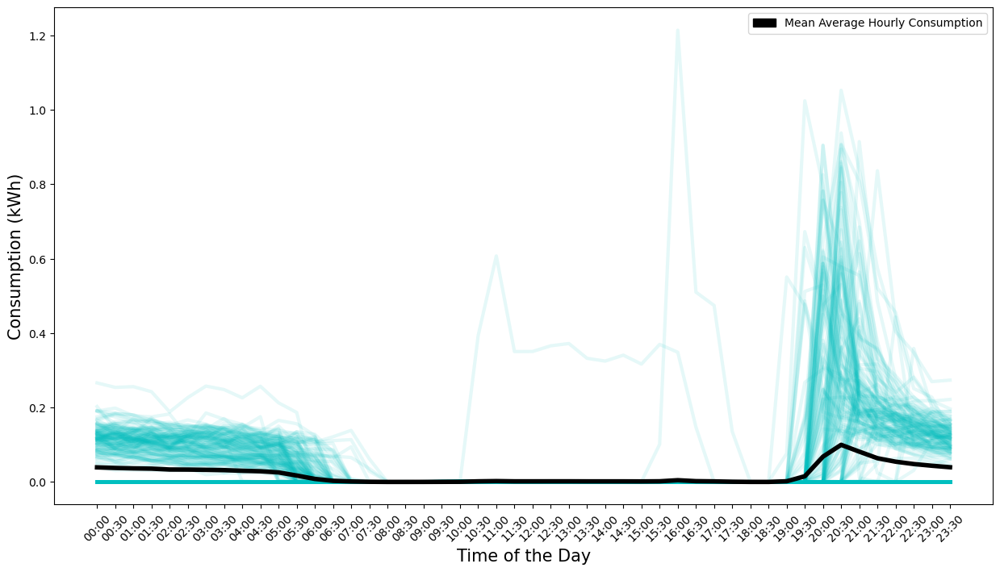

In [101]:



plt.figure(num=2, figsize=(15,8))
plt.plot(Hourly, color='c', alpha=0.1, linewidth=3)
plt.plot(Hourly.mean(axis=1),color='k', alpha=1, linewidth='4')
plt.ylabel('Consumption (kWh)', fontsize = 15)
plt.xticks(Hourly.index.astype(str), fontsize = 10, rotation = 45)
plt.xlabel('Time of the Day', fontsize = 15)
leg= mpatches.Patch(color='black', label='Mean Average Hourly Consumption')
plt.legend(handles=[leg])
plt.show()

In [ ]:


# Directory containing the household CSV files
data_dir = cleaned_data_directory

# Create a complete date range for 2023 in 30-minute increments
date_range = pd.date_range(start='2023-01-01 00:00:00', end='2023-12-31 23:30:00', freq='30T')

# Initialize an empty DataFrame with the date range as the index
combined_df = pd.DataFrame(index=date_range)

# Iterate through each CSV file in the directory
for filename in os.listdir(data_dir):
    if filename.endswith("_profile.csv"):
        file_path = os.path.join(data_dir, filename)
        
        # Load the household CSV file
        df = pd.read_csv(file_path)
        
        # Convert the 'TS' column to datetime
        df['TS'] = pd.to_datetime(df['TS'])
        
        # Set 'TS' as the index and extract 'Air_Conditioner_Load'
        df = df.set_index('TS')['Air_Conditioner_Load']
        
        # Extract site ID from the filename (assuming the filename format is 'siteid_profile.csv')
        site_id = filename.split('_')[0]
        
        # Merge the data with the combined DataFrame based on timestamps
        combined_df[site_id] = df.reindex(combined_df.index)





# Save the combined DataFrame to a CSV file (optional)
# combined_df.to_csv('combined_air_conditioner_load_profiles.csv')
combined_df = combined_df.reset_index()

combined_df = combined_df.rename(columns={'index': 'Timestamp'})
print(combined_df.head())

In [88]:
ids_to_remove = [
    'S0024', 'S0159', 'S0318', 'S0444', 'S0470',
    'W0082', 'W0120', 'W0162', 'W0175', 'W0224',
    'W0241', 'W0243', 'W0315', 'W0324', 'W0330', 'W0310', 'W0335', "W0336"
]

combined_df = combined_df.drop(columns=ids_to_remove, errors = 'ignore')

# Define the path for the CSV file
csv_path = os.path.join(base_directory, 'combined_aircon_profiles.csv')

# Write to CSV only if the file doesn't already exist
if not os.path.exists(csv_path):
    combined_df.to_csv(csv_path, index=False)
    print(f'File written: {csv_path}')
else:
    print('File already exists!')

File written: C:/Users/CEEM04/OneDrive-Emily/OneDrive - UNSW/edpdatacleaning\combined_aircon_profiles.csv


In [89]:

combined_df['Month'] = combined_df["Timestamp"].dt.month

# Making a new dataframe 'Summer' with data cooresponding to summer months
summer = (combined_df.Month >=6) & (combined_df.Month <=8) # Since summer has months from July (6) to August (8)
Summer_df=combined_df[summer].reset_index(drop=True)
Summer_df=Summer_df.drop('Month',axis=1)

# Making a new dataframe 'Fall' with data cooresponding to fall months
fall = (combined_df.Month >=9) & (combined_df.Month <=11) # Since fall has months from September (9) to November (11)
Fall_df=combined_df[fall].reset_index(drop=True)
Fall_df=Fall_df.drop('Month',axis=1)

# Making a new dataframe 'Winter' with data cooresponding to winter months
winter = (combined_df.Month <=2) | (combined_df.Month ==12) # Since winter has months from January (1) to February (2) and month of december(12)
Winter_df=combined_df[winter].reset_index(drop=True)
Winter_df=Winter_df.drop('Month',axis=1)

# Making a new dataframe 'Spring' with data cooresponding to spring months
spring = (combined_df.Month >=3) & (combined_df.Month <=5) # Since spring has months from March (3) to May (5)
Spring_df=combined_df[spring].reset_index(drop=True)
Spring_df=Spring_df.drop('Month',axis=1)

# Checking whether the assignment of data into the four dataframes is correct or not

Summer_df['Weekday'] = Summer_df['Timestamp'].dt.weekday
Fall_df['Weekday'] = Fall_df['Timestamp'].dt.weekday
Winter_df['Weekday'] = Winter_df['Timestamp'].dt.weekday
Spring_df['Weekday'] = Spring_df['Timestamp'].dt.weekday
import pandas as pd

def split_season_by_day_type(season_df, day_type):

    
    # Add a 'Day_Type' column: 'WD' for weekdays and 'WE' for weekends
    season_df['Day_Type'] = season_df['Weekday'].apply(lambda x: 'WD' if x < 5 else 'WE')

    # Filter based on the 'day_type' input
    return season_df[season_df['Day_Type'] == day_type]


# Example usage for each season dataframe:
# Get weekdays data for summer
summer_weekdays = split_season_by_day_type(Summer_df, 'WD')
# Get weekends data for summer
summer_weekends = split_season_by_day_type(Summer_df, 'WE')
# Similarly for other seasons:
fall_weekdays = split_season_by_day_type(Fall_df, 'WD')
fall_weekends = split_season_by_day_type(Fall_df, 'WE')
winter_weekdays = split_season_by_day_type(Winter_df, 'WD')
winter_weekends = split_season_by_day_type(Winter_df, 'WE')
spring_weekdays = split_season_by_day_type(Spring_df, 'WD')
spring_weekends = split_season_by_day_type(Spring_df, 'WE')




In [90]:
def process(df):
    df.name = '%s'%df
    # Changing the resolution of the data to '1 hour'.
    df=df.set_index('Timestamp', drop=True, append=False, inplace=False, verify_integrity=False)

    # Adding a new 'Hour' column to get the hour and minutes of all corresponding timestamps
    df['Hour'] = pd.to_datetime(df.index, format='%H:%M').time
    df['Hour'] = df.Hour.apply(lambda x: x.strftime('%H:%M'))
    df['Date'] = df.index.date

    # Grouping the dataframe by hour to get 24 hours of the day as index (0 to 23)
    Hourly=df.groupby(['Hour']).mean()

    # Normalizing the data by dividing all hourly electric consumptions of the given 
    # household, with largest houly consumption.
    Hourly_normalized=Hourly.apply(lambda x: (x / (np.max(x))))
    
    return Hourly_normalized

In [ ]:
# Apply the process function and rename accordingly

# Summer
summer_weekdays = process(summer_weekdays)
summer_weekdays.name = 'Summer (Weekdays)'

summer_weekends = process(summer_weekends)
summer_weekends.name = 'Summer (Weekends)'

# Fall
fall_weekdays = process(fall_weekdays)
fall_weekdays.name = 'Fall (Weekdays)'

fall_weekends = process(fall_weekends)
fall_weekends.name = 'Fall (Weekends)'

# Winter
winter_weekdays = process(winter_weekdays)
winter_weekdays.name = 'Winter (Weekdays)'

winter_weekends = process(winter_weekends)
winter_weekends.name = 'Winter (Weekends)'

# Spring
spring_weekdays = process(spring_weekdays)
spring_weekdays.name = 'Spring (Weekdays)'

spring_weekends = process(spring_weekends)
spring_weekends.name = 'Spring (Weekends)'



In [79]:
def visualize (df):
    plt.figure(num=2, figsize=(15,8))
    plt.plot(df, color='c', alpha=0.1, linewidth='3')
    plt.plot(df.mean(axis=1),color='k', alpha=1, linewidth='4')
    plt.title(df.name, fontsize = 20)
    plt.ylabel('Normalized Average Hourly Consumption', fontsize = 15)
    plt.xticks(df.index)
    plt.xlabel('Time of the Day', fontsize = 15)
    l = mpatches.Patch(color='black', label='Mean Normalized Average Hourly Consumption')
    plt.legend(handles=[l])
    plt.show()

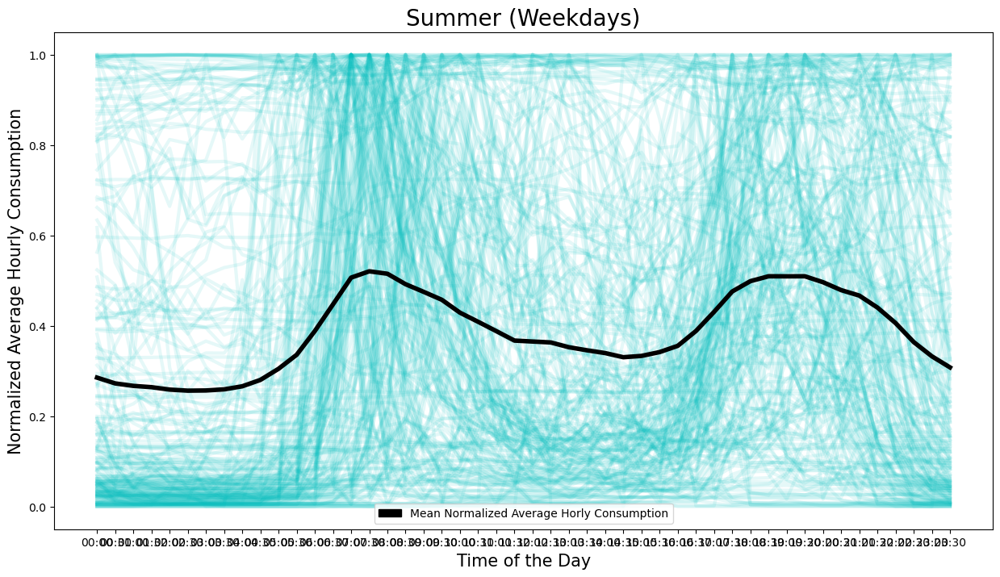

In [80]:
visualize(summer_weekdays)

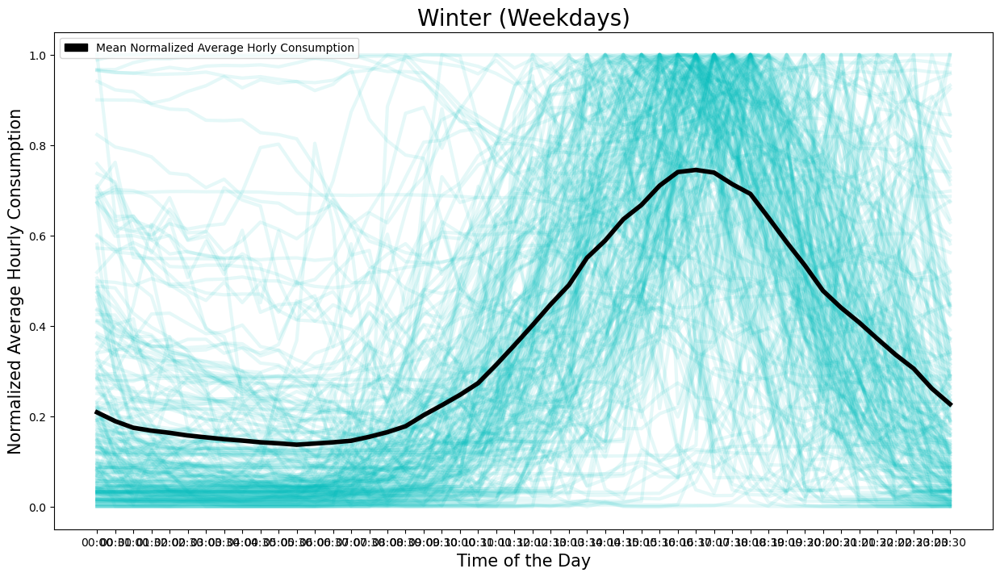

In [150]:
visualize(winter_weekdays)

In [ ]:
S=summer_weekdays
error_summer=[]
for k in range(1,15):
    cluster1 = KMeans(n_clusters = k)
    cluster1.fit_predict(S[S.columns[0:]])
    error_summer.append(cluster1.inertia_)

clusters_summer_weekdays = pd.DataFrame( { "num_clusters":range(1,15), "WSS": error_summer } )

plt.plot( clusters_summer_weekdays.num_clusters, clusters_summer_weekdays.WSS, marker = "o" )
plt.xlabel('Number of clusters')
plt.ylabel('WSS')
plt.title('Summer')
plt.show()

clusters_summer_weekdays

In [93]:
#fall_weekdays_interpolated = fall_weekdays.interpolate(method='linear', axis=0)
# Forward-fill and backward-fill to handle any remaining NaN values at the boundaries
#fall_weekdays_interpolated = fall_weekdays_interpolated.fillna(method='ffill').fillna(method='bfill')

# Display exact locations of NaN values in terms of row and column
nan_positions = summer_weekdays.isnull()
nan_indices = nan_positions[nan_positions == True].stack().index
print("NaN values found at the following (row, column) positions:")
print(nan_indices)

NaN values found at the following (row, column) positions:
MultiIndex([], names=['Hour', None])


use silouhette method to find optimal number of weekdays 

In [113]:
def kmeans_sil(num_clusters, x_vals):
    '''
    Fits a KMeans model for different values of k.
    Calculates a silhouette score for each k value

    Args:
        num_clusters: (list of ints)  - The different k values to try
        x_vals:       (array)         - The training data

    Returns: 
        sil_score:    (list)          - A list of silhouette scores, one for each \
                                      value of k
    '''
  
    sil_score = []
    for num in num_clusters:
        kms = KMeans(n_clusters=num, random_state=42)
        kms.fit(x_vals)
        sil_score.append(mt.silhouette_score(x_vals, kms.labels_))
    
    return sil_score

c:\Users\CEEM04\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

c:\Users\CEEM04\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

c:\Users\CEEM04\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

c:\Users\CEEM04\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks t

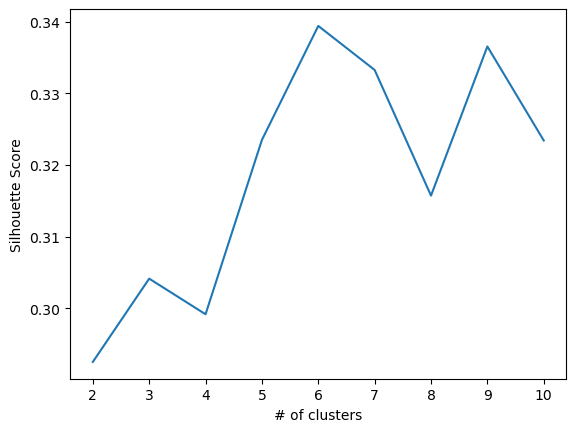

In [116]:
num_clusters = [i for i in range(2, 11)]

sil_score = kmeans_sil(num_clusters, fall_weekdays)

# Create a line plot of silhouette scores 
plot = sns.lineplot(x=num_clusters, y=sil_score)
plot.set_xlabel("# of clusters");
plot.set_ylabel("Silhouette Score");

visualize elbow method of finding optimal number of weekdays 

c:\Users\CEEM04\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\CEEM04\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

c:\Users\CEEM04\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\CEEM04\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

c:\Use

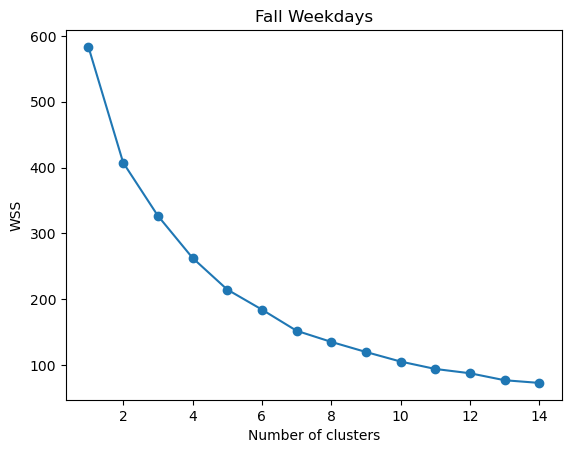

,num_clusters,WSS
0,1,583.183224
1,2,407.540511
2,3,326.829083
3,4,262.786188
4,5,214.718588
5,6,184.269254
6,7,152.081311
7,8,135.171222
8,9,119.830957
9,10,105.299551


In [94]:
S=fall_weekdays
error_fall=[]
for k in range(1,15):
    cluster1 = KMeans(n_clusters = k)
    cluster1.fit_predict(S[S.columns[0:]])
    error_fall.append(cluster1.inertia_)

clusters_fall_weekdays = pd.DataFrame( { "num_clusters":range(1,15), "WSS": error_fall } )

plt.plot( clusters_fall_weekdays.num_clusters, clusters_fall_weekdays.WSS, marker = "o" )
plt.xlabel('Number of clusters')
plt.ylabel('WSS')
plt.title('Fall Weekdays')
plt.show()

clusters_fall_weekdays

c:\Users\CEEM04\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\CEEM04\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

c:\Users\CEEM04\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\CEEM04\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

c:\Use

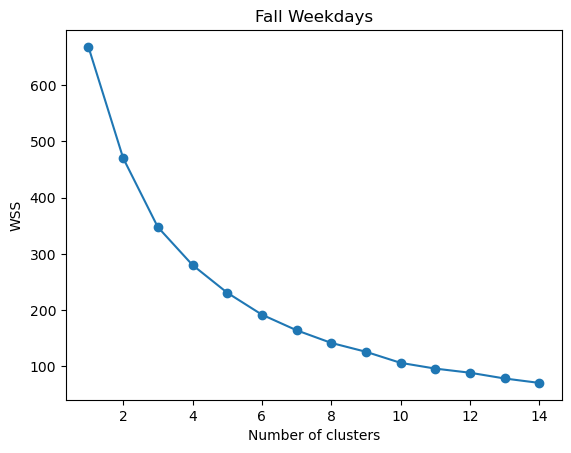

,num_clusters,WSS
0,1,667.451611
1,2,470.108398
2,3,347.451250
3,4,280.086950
4,5,230.919981
5,6,191.960809
6,7,164.206899
7,8,141.754906
8,9,125.987119
9,10,106.324305


In [95]:
S=spring_weekdays
error_fall=[]
for k in range(1,15):
    cluster1 = KMeans(n_clusters = k)
    cluster1.fit_predict(S[S.columns[0:]])
    error_fall.append(cluster1.inertia_)

clusters_spring_weekdays = pd.DataFrame( { "num_clusters":range(1,15), "WSS": error_fall } )

plt.plot( clusters_spring_weekdays.num_clusters, clusters_spring_weekdays.WSS, marker = "o" )
plt.xlabel('Number of clusters')
plt.ylabel('WSS')
plt.title('Spring Weekdays')
plt.show()

clusters_spring_weekdays

c:\Users\CEEM04\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\CEEM04\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

c:\Users\CEEM04\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\CEEM04\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

c:\Use

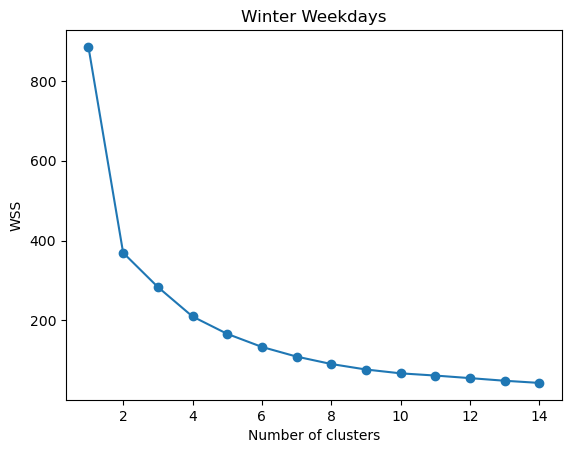

,num_clusters,WSS
0,1,885.333682
1,2,369.475642
2,3,283.628250
3,4,209.720796
4,5,166.177079
5,6,133.424865
6,7,109.209956
7,8,90.605759
8,9,76.838537
9,10,67.223507


In [96]:
S=winter_weekdays
error_fall=[]
for k in range(1,15):
    cluster1 = KMeans(n_clusters = k)
    cluster1.fit_predict(S[S.columns[0:]])
    error_fall.append(cluster1.inertia_)

clusters_winter_weekdays = pd.DataFrame( { "num_clusters":range(1,15), "WSS": error_fall } )

plt.plot( clusters_winter_weekdays.num_clusters, clusters_winter_weekdays.WSS, marker = "o" )
plt.xlabel('Number of clusters')
plt.ylabel('WSS')
plt.title('Winter Weekdays')
plt.show()

clusters_winter_weekdays

In [97]:
import os

# Define the base directory and the sub-directory 'binned_data'
binned_data_directory = os.path.join(base_directory, "binned_data")

# Create the 'binned_data' directory if it doesn't already exist
os.makedirs(binned_data_directory, exist_ok=True)

# List of dataframes you want to export
dataframes = [
    (fall_weekdays, "Fall_Weekdays.csv"),
    (fall_weekends, "Fall_Weekends.csv"),
    (winter_weekdays, "Winter_Weekdays.csv"),
    (winter_weekends, "Winter_Weekends.csv"),
    (spring_weekdays, "Spring_Weekdays.csv"),
    (spring_weekends, "Spring_Weekends.csv"), 
    (summer_weekdays, "Summer_Weekdays.csv"),
    (summer_weekends, "Summer_Weekends.csv")
]

# Loop through each dataframe and export it as a CSV file
for df, filename in dataframes:
    csv_path = os.path.join(binned_data_directory, filename)
    
    # Check if the file already exists
    if os.path.exists(csv_path):
        print(f"{filename} already exists. Skipping...")
        continue  # Skip to the next iteration if the file exists
    
    df.to_csv(csv_path, index=False)
    print(f"Saved {df.name} as {filename} at {csv_path}")


Saved Fall (Weekdays) as Fall_Weekdays.csv at C:/Users/CEEM04/OneDrive-Emily/OneDrive - UNSW/edpdatacleaning\binned_data\Fall_Weekdays.csv
Saved Fall (Weekends) as Fall_Weekends.csv at C:/Users/CEEM04/OneDrive-Emily/OneDrive - UNSW/edpdatacleaning\binned_data\Fall_Weekends.csv
Saved Winter (Weekdays) as Winter_Weekdays.csv at C:/Users/CEEM04/OneDrive-Emily/OneDrive - UNSW/edpdatacleaning\binned_data\Winter_Weekdays.csv
Saved Winter (Weekends) as Winter_Weekends.csv at C:/Users/CEEM04/OneDrive-Emily/OneDrive - UNSW/edpdatacleaning\binned_data\Winter_Weekends.csv
Saved Spring (Weekdays) as Spring_Weekdays.csv at C:/Users/CEEM04/OneDrive-Emily/OneDrive - UNSW/edpdatacleaning\binned_data\Spring_Weekdays.csv
Saved Spring (Weekends) as Spring_Weekends.csv at C:/Users/CEEM04/OneDrive-Emily/OneDrive - UNSW/edpdatacleaning\binned_data\Spring_Weekends.csv
Saved Summer (Weekdays) as Summer_Weekdays.csv at C:/Users/CEEM04/OneDrive-Emily/OneDrive - UNSW/edpdatacleaning\binned_data\Summer_Weekdays.c

Decided on cluster number of 4 due to elbow visualizations

In [128]:
num_clusters = 5

In [129]:
def cluster(x, num_clusters):
    y=x.T # Since we need to assign households to clusters and not hour of the day, the dataframe is transposed
    cluster = KMeans(n_clusters=num_clusters)
    # Adding a new column 'cluster_number' containing cluster assignment (0, 1 or 2) for each household.
    y['cluster_number']=cluster.fit_predict(y[y.columns[0:]])
    y.name = x.name
    return y

In [130]:
s_wd_cl = cluster(summer_weekdays, num_clusters)
s_we_cl = cluster(summer_weekends, num_clusters)
f_wd_cl = cluster(fall_weekdays, num_clusters)
f_we_cl = cluster(fall_weekends, num_clusters)
w_wd_cl = cluster(winter_weekdays, num_clusters)
w_we_cl = cluster(winter_weekends, num_clusters)
sp_wd_cl = cluster(spring_weekdays, num_clusters)
sp_we_cl = cluster(spring_weekends, num_clusters)


In [ ]:
## WIP: finding the davies-bouldin index...
summer_weekdays_t=summer_weekdays.T
# Perform K-Means clustering
kmeans = KMeans(n_clusters=5)
kmeans.fit(summer_weekdays_t)
 
# Get the cluster labels
labels = kmeans.labels_
 
# Calculate Davies-Bouldin Index
db_index = mt.davies_bouldin_score(summer_weekdays_t, labels)
print(f"Davies-Bouldin Index: {db_index}")
 
# Plot the clustering results in a scatter plot
plt.figure(figsize=(8, 6))
 
# Extract the centroids of each cluster
centroids = kmeans.cluster_centers_
 
# Scatter plot the data points with different colors for each cluster
for i in range(5):
    cluster_data = summer_weekdays_t[labels == i]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], label=f'Cluster {i + 1}')
 
# Plot the centroids as well
plt.scatter(centroids[:, 0], centroids[:, 1], s=200, c='k', marker='X', label='Centroids')
 
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('K-Means Clustering Results')
plt.legend()
plt.show()

In [102]:
# visualizing the different assignments 

Assignment_df = pd.DataFrame(data=None, index=s_wd_cl.index, columns=None, dtype=None, copy=False)
Assignment_df['Summer Weekdays'] = s_wd_cl['cluster_number']
Assignment_df['Summer Weekends'] = s_we_cl['cluster_number']
Assignment_df['Fall Weekdays'] = f_wd_cl['cluster_number']
Assignment_df['Fall Weekends'] = f_we_cl['cluster_number']
Assignment_df['Winter Weekdays'] = w_wd_cl['cluster_number']
Assignment_df['Winter Weekends'] = w_we_cl['cluster_number']
Assignment_df['Spring Weekdays'] = sp_wd_cl['cluster_number']
Assignment_df['Spring Weekends'] = sp_we_cl['cluster_number']
Assignment_df.head()


,Summer Weekdays,Summer Weekends,Fall Weekdays,Fall Weekends,Winter Weekdays,Winter Weekends,Spring Weekdays,Spring Weekends
S0083,1,1,0,0,1,2,2,2
S0089,2,1,0,0,1,2,1,2
S0106,1,1,0,0,1,2,1,2
S0107,0,2,2,1,0,2,0,1
S0110,0,2,2,1,1,1,2,2


In [148]:

def cluster_visualization(x, num_clusters, ax):
    ax.set_xlabel('Time of the Day', fontsize=12)
    ax.set_ylabel('Average Electricity Consumption (kWh)', fontsize=12)
    ax.set_title(x.name, fontsize=14)
    # Setting the x-axis limits
    #ax.set_xlim(0, 25)  # Adjusting to the range for 30-min intervals in a 24-hour day (48 intervals)
    
    # Set ticks for every hour, considering the 30-min intervals
    ax.set_xticks(range(0, 48, 4))  # Ticks every 2 intervals (1 hour)
    ax.set_xticklabels([f"{i//2}:00" for i in range(0, 48, 4)])  # Formatting for hour labels
   
    ax.tick_params(axis='x', labelrotation=45)
    
    colors = plt.cm.viridis(np.linspace(0, 1, num_clusters))
    legend_handles = []

    for i in range(num_clusters):
        cluster_data = x[x.cluster_number == i].reset_index(drop=True).drop(['cluster_number'], axis=1)

        # Plot the mean of the cluster
        ax.plot(cluster_data.mean(), color=colors[i], label=f'Cluster {i+1}')
        ax.plot(cluster_data.T, color=colors[i], alpha=0.02)

        # Create legend handles
        legend_handles.append(mpatches.Patch(color=colors[i], label=f'Cluster {i+1}'))

    ax.legend(handles=legend_handles, loc='upper right', fontsize=10)

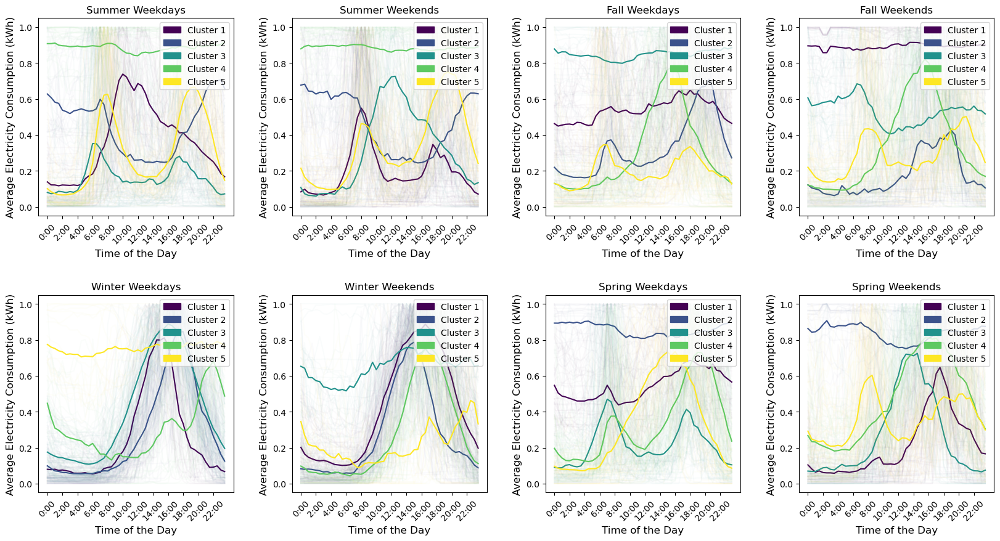

In [149]:
# Create a grid for subplots
fig, axs = plt.subplots(2, 4, figsize=(20, 10))
plt.subplots_adjust(hspace=0.4, wspace=0.3)  # Adjust space between subplots

# Fill in the subplots with visualizations
cluster_visualization(s_wd_cl, num_clusters, axs[0, 0])
axs[0, 0].set_title('Summer Weekdays')

cluster_visualization(s_we_cl, num_clusters, axs[0, 1])
axs[0, 1].set_title('Summer Weekends')

cluster_visualization(f_wd_cl, num_clusters, axs[0, 2])
axs[0, 2].set_title('Fall Weekdays')

cluster_visualization(f_we_cl, num_clusters, axs[0, 3])
axs[0, 3].set_title('Fall Weekends')

cluster_visualization(w_wd_cl, num_clusters, axs[1, 0])
axs[1, 0].set_title('Winter Weekdays')

cluster_visualization(w_we_cl, num_clusters, axs[1, 1])
axs[1, 1].set_title('Winter Weekends')

cluster_visualization(sp_wd_cl, num_clusters, axs[1, 2])
axs[1, 2].set_title('Spring Weekdays')

cluster_visualization(sp_we_cl, num_clusters, axs[1, 3])
axs[1, 3].set_title('Spring Weekends')

plt.show()
